In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

In [2]:
import os

In [3]:
DATA_DIR = "Datasets"

In [4]:
os.listdir(DATA_DIR)

['Uber-Jan-Feb-FOIL.csv',
 'uber-raw-data-apr14.csv',
 'uber-raw-data-aug14.csv',
 'uber-raw-data-janjune-15_sample.csv',
 'uber-raw-data-jul14.csv',
 'uber-raw-data-jun14.csv',
 'uber-raw-data-may14.csv',
 'uber-raw-data-sep14.csv']

In [5]:
uber_15=pd.read_csv(os.path.join(DATA_DIR, "uber-raw-data-janjune-15_sample.csv"))

In [6]:
uber_15.shape

(100000, 4)

In [7]:
type(uber_15)

pandas.core.frame.DataFrame

In [8]:
uber_15.duplicated().sum()

54

In [9]:
uber_15.drop_duplicates(inplace=True)

In [10]:
uber_15.duplicated().sum()

0

In [11]:
uber_15.shape

(99946, 4)

In [12]:
uber_15.dtypes

Dispatching_base_num    object
Pickup_date             object
Affiliated_base_num     object
locationID               int64
dtype: object

In [13]:
uber_15.isnull()

,Dispatching_base_num,Pickup_date,Affiliated_base_num,locationID
0,False,False,False,False
1,False,False,False,False
2,False,False,False,False
3,False,False,False,False
4,False,False,False,False
...,...,...,...,...
99995,False,False,False,False
99996,False,False,False,False
99997,False,False,False,False
99998,False,False,False,False


In [14]:
uber_15.isnull().sum()

Dispatching_base_num       0
Pickup_date                0
Affiliated_base_num     1116
locationID                 0
dtype: int64

In [15]:
type(uber_15["Pickup_date"][0])

str

In [16]:
uber_15["Pickup_date"]=pd.to_datetime(uber_15["Pickup_date"])

In [17]:
uber_15.dtypes

Dispatching_base_num            object
Pickup_date             datetime64[ns]
Affiliated_base_num             object
locationID                       int64
dtype: object

In [18]:
type(uber_15["Pickup_date"][0])

pandas._libs.tslibs.timestamps.Timestamp

In [19]:
print(uber_15)

      Dispatching_base_num         Pickup_date Affiliated_base_num  locationID
0                   B02617 2015-05-02 21:43:00              B02764         237
1                   B02682 2015-01-20 19:52:59              B02682         231
2                   B02617 2015-03-19 20:26:00              B02617         161
3                   B02764 2015-04-10 17:38:00              B02764         107
4                   B02764 2015-03-23 07:03:00              B00111         140
...                    ...                 ...                 ...         ...
99995               B02764 2015-04-13 16:12:00              B02764         234
99996               B02764 2015-03-06 21:32:00              B02764          24
99997               B02598 2015-03-19 19:56:00              B02598          17
99998               B02682 2015-05-02 16:02:00              B02682          68
99999               B02764 2015-06-24 16:04:00              B02764         125

[99946 rows x 4 columns]


In [20]:
uber_15["Pickup_date"].dt.month

0        5
1        1
2        3
3        4
4        3
        ..
99995    4
99996    3
99997    3
99998    5
99999    6
Name: Pickup_date, Length: 99946, dtype: int32

In [21]:
uber_15["month"] = uber_15['Pickup_date'].dt.month_name()

In [22]:
uber_15["month"]

0            May
1        January
2          March
3          April
4          March
          ...   
99995      April
99996      March
99997      March
99998        May
99999       June
Name: month, Length: 99946, dtype: object

In [23]:
uber_15

,Dispatching_base_num,Pickup_date,Affiliated_base_num,locationID,month
0,B02617,2015-05-02 21:43:00,B02764,237,May
1,B02682,2015-01-20 19:52:59,B02682,231,January
2,B02617,2015-03-19 20:26:00,B02617,161,March
3,B02764,2015-04-10 17:38:00,B02764,107,April
4,B02764,2015-03-23 07:03:00,B00111,140,March
...,...,...,...,...,...
99995,B02764,2015-04-13 16:12:00,B02764,234,April
99996,B02764,2015-03-06 21:32:00,B02764,24,March
99997,B02598,2015-03-19 19:56:00,B02598,17,March
99998,B02682,2015-05-02 16:02:00,B02682,68,May


<Axes: xlabel='month'>

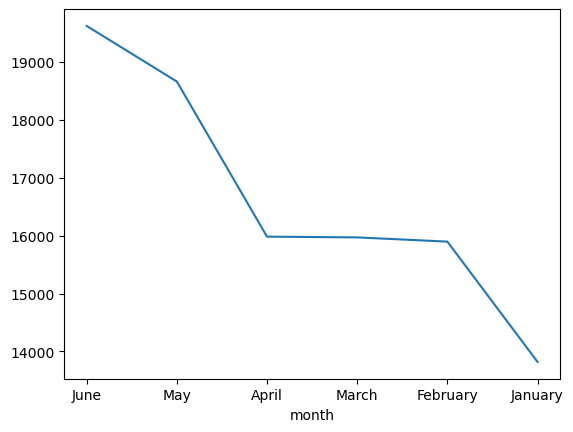

In [24]:
uber_15.month.value_counts().plot()

<Axes: xlabel='month'>

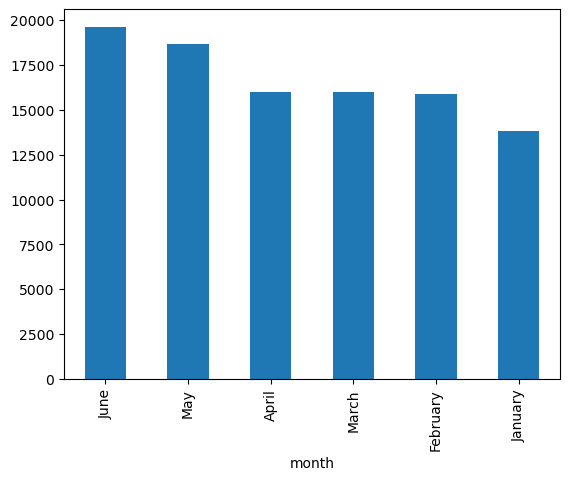

In [25]:
uber_15['month'].value_counts().plot(kind = "bar")

In [26]:
uber_15['day_name']=uber_15['Pickup_date'].dt.day_name()
uber_15['day']=uber_15['Pickup_date'].dt.day
uber_15['hour']=uber_15["Pickup_date"].dt.hour
uber_15['minute']=uber_15['Pickup_date'].dt.minute

In [27]:
uber_15.shape

(99946, 9)

In [28]:
uber_15.dtypes

Dispatching_base_num            object
Pickup_date             datetime64[ns]
Affiliated_base_num             object
locationID                       int64
month                           object
day_name                        object
day                              int32
hour                             int32
minute                           int32
dtype: object

In [29]:
uber_15.head(4)

,Dispatching_base_num,Pickup_date,Affiliated_base_num,locationID,month,day_name,day,hour,minute
0,B02617,2015-05-02 21:43:00,B02764,237,May,Saturday,2,21,43
1,B02682,2015-01-20 19:52:59,B02682,231,January,Tuesday,20,19,52
2,B02617,2015-03-19 20:26:00,B02617,161,March,Thursday,19,20,26
3,B02764,2015-04-10 17:38:00,B02764,107,April,Friday,10,17,38


In [30]:
pivot = pd.crosstab(index=uber_15["month"], columns=uber_15["day_name"])

In [31]:
pivot

day_name,Friday,Monday,Saturday,Sunday,Thursday,Tuesday,Wednesday
month,,,,,,,
April,2365,1833,2508,2052,2823,1880,2521
February,2655,1970,2550,2183,2396,2129,2013
January,2508,1353,2745,1651,2378,1444,1740
June,2793,2848,3037,2485,2767,3187,2503
March,2465,2115,2522,2379,2093,2388,2007
May,3262,1865,3519,2944,2627,2115,2328


<Axes: xlabel='month'>

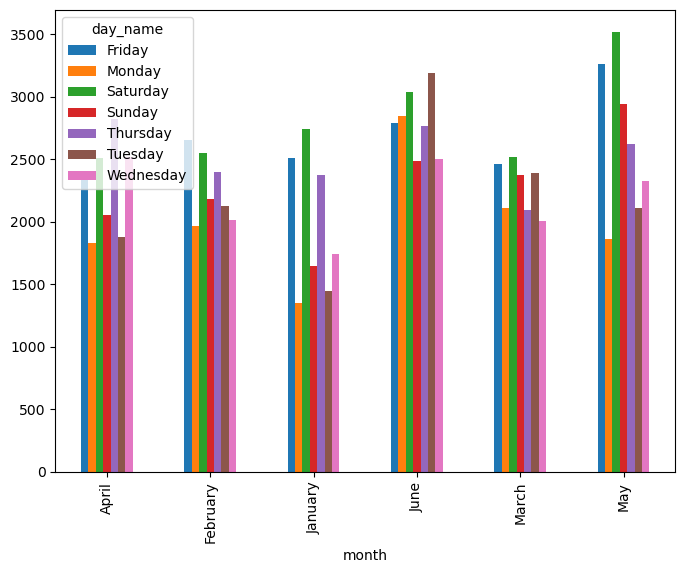

In [32]:
pivot.plot(kind = "bar", figsize = (8,6) )

In [33]:
summary = uber_15.groupby(["day_name","hour"], as_index = False).size()

In [34]:
summary

,day_name,hour,size
0,Friday,0,581
1,Friday,1,333
2,Friday,2,197
3,Friday,3,138
4,Friday,4,161
...,...,...,...
163,Wednesday,19,1044
164,Wednesday,20,897
165,Wednesday,21,949
166,Wednesday,22,900


<Axes: title={'center': 'Hourly Uber trip analysis for day of week'}, xlabel='hour', ylabel='size'>

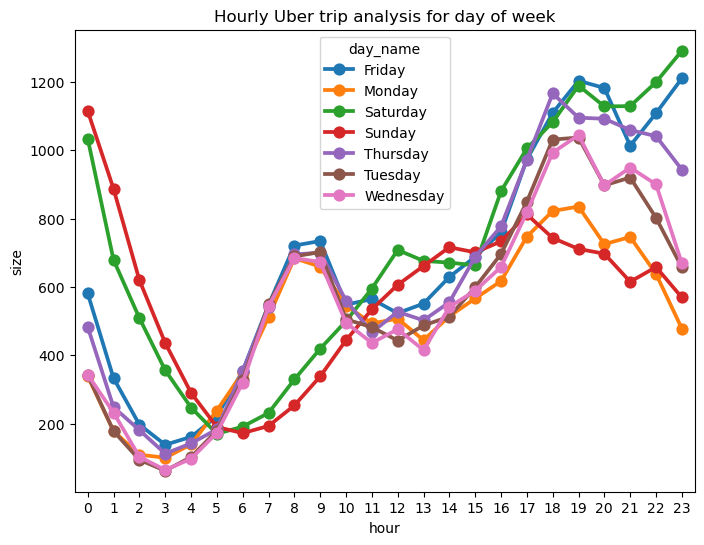

In [35]:
plt.figure(figsize=(8,6))
plt.title("Hourly Uber trip analysis for day of week")
sns.pointplot(x="hour", y="size", hue="day_name", data=summary)

In [36]:
uber_15.columns

Index(['Dispatching_base_num', 'Pickup_date', 'Affiliated_base_num',
       'locationID', 'month', 'day_name', 'day', 'hour', 'minute'],
      dtype='object')

In [37]:
uber_foil=pd.read_csv(os.path.join(DATA_DIR, "Uber-Jan-Feb-FOIL.csv"))

In [38]:
uber_foil.shape

(354, 4)

In [39]:
uber_foil.dtypes

dispatching_base_number    object
date                       object
active_vehicles             int64
trips                       int64
dtype: object

In [40]:
!pip install chart_studio
!pip install plotly

In [41]:
import chart_studio.plotly as py
import plotly.graph_objs as go
import plotly.express as px

from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot

In [42]:
init_notebook_mode(connected=True)

In [43]:
uber_foil.columns

Index(['dispatching_base_number', 'date', 'active_vehicles', 'trips'], dtype='object')

In [44]:
uber_15.columns

Index(['Dispatching_base_num', 'Pickup_date', 'Affiliated_base_num',
       'locationID', 'month', 'day_name', 'day', 'hour', 'minute'],
      dtype='object')

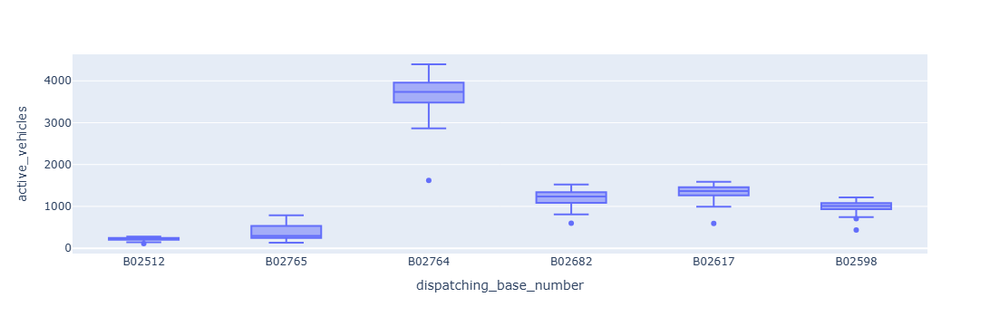

In [45]:
px.box(x="dispatching_base_number", y="active_vehicles", data_frame=uber_foil)

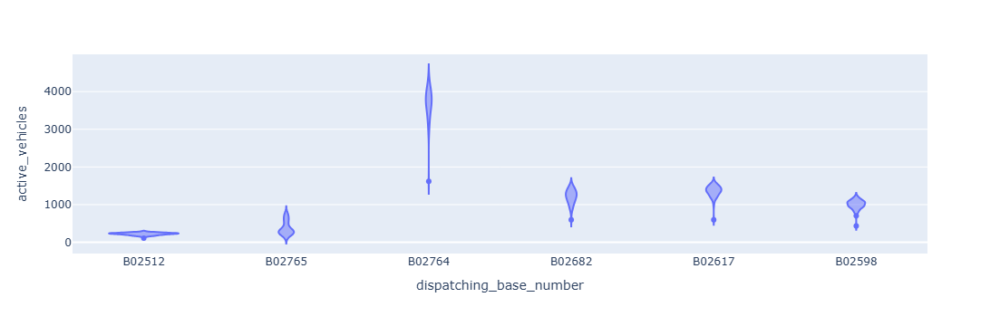

In [46]:
px.violin(x="dispatching_base_number", y="active_vehicles", data_frame=uber_foil)

In [47]:
file=os.listdir(DATA_DIR)

In [48]:
file

['Uber-Jan-Feb-FOIL.csv',
 'uber-raw-data-apr14.csv',
 'uber-raw-data-aug14.csv',
 'uber-raw-data-janjune-15_sample.csv',
 'uber-raw-data-jul14.csv',
 'uber-raw-data-jun14.csv',
 'uber-raw-data-may14.csv',
 'uber-raw-data-sep14.csv']

In [49]:
final = pd.DataFrame()
for d in file:
    current_df=pd.read_csv(os.path.join(DATA_DIR, d))
    final = pd.concat([final, current_df])

In [50]:
final

,dispatching_base_number,date,active_vehicles,trips,Date/Time,Lat,Lon,Base,Dispatching_base_num,Pickup_date,Affiliated_base_num,locationID
0,B02512,1/1/2015,190.0,1132.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,B02765,1/1/2015,225.0,1765.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,B02764,1/1/2015,3427.0,29421.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,B02682,1/1/2015,945.0,7679.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,B02617,1/1/2015,1228.0,9537.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...
1028131,NaN,NaN,NaN,NaN,9/30/2014 22:57:00,40.7668,-73.9845,B02764,NaN,NaN,NaN,NaN
1028132,NaN,NaN,NaN,NaN,9/30/2014 22:57:00,40.6911,-74.1773,B02764,NaN,NaN,NaN,NaN
1028133,NaN,NaN,NaN,NaN,9/30/2014 22:58:00,40.8519,-73.9319,B02764,NaN,NaN,NaN,NaN
1028134,NaN,NaN,NaN,NaN,9/30/2014 22:58:00,40.7081,-74.0066,B02764,NaN,NaN,NaN,NaN


In [51]:
final.duplicated().sum()

82635

In [52]:
final.drop_duplicates(inplace=True)

In [53]:
rush_uber=final.groupby(["Lat", "Lon"], as_index=False).sum()

In [54]:
rush_uber.head(4)

,Lat,Lon,dispatching_base_number,date,active_vehicles,trips,Date/Time,Base,Dispatching_base_num,Pickup_date,Affiliated_base_num,locationID
0,39.6569,-74.2258,0,0,0.0,0.0,8/1/2014 19:32:00,B02598,0,0,0,0.0
1,39.6686,-74.1607,0,0,0.0,0.0,8/23/2014 13:35:00,B02682,0,0,0,0.0
2,39.7214,-74.2446,0,0,0.0,0.0,7/12/2014 14:16:00,B02617,0,0,0,0.0
3,39.8416,-74.1512,0,0,0.0,0.0,7/19/2014 22:21:00,B02617,0,0,0,0.0


In [55]:
!pip install folium

In [56]:
import folium

In [57]:
base_map = folium.Map()

In [58]:
base_map

In [59]:
from folium.plugins import HeatMap

In [60]:
heat_data = rush_uber[['Lat', 'Lon']].dropna().values.tolist()

In [61]:
HeatMap(heat_data).add_to(base_map)

In [62]:
base_map

In [63]:
final.dtypes

dispatching_base_number     object
date                        object
active_vehicles            float64
trips                      float64
Date/Time                   object
Lat                        float64
Lon                        float64
Base                        object
Dispatching_base_num        object
Pickup_date                 object
Affiliated_base_num         object
locationID                 float64
dtype: object

In [64]:
final["Date/Time"]=pd.to_datetime(final["Date/Time"])

In [65]:
final.dtypes

dispatching_base_number            object
date                               object
active_vehicles                   float64
trips                             float64
Date/Time                  datetime64[ns]
Lat                               float64
Lon                               float64
Base                               object
Dispatching_base_num               object
Pickup_date                        object
Affiliated_base_num                object
locationID                        float64
dtype: object

In [66]:
final["day"]=final["Date/Time"].dt.day
final["hour"]=final["Date/Time"].dt.hour
final["month"]=final["Date/Time"].dt.month
final["year"]=final["Date/Time"].dt.year

In [67]:
final.head(1)

,dispatching_base_number,date,active_vehicles,trips,Date/Time,Lat,Lon,Base,Dispatching_base_num,Pickup_date,Affiliated_base_num,locationID,day,hour,month,year
0,B02512,1/1/2015,190.0,1132.0,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [68]:
pivot = final.groupby(["day", "hour"]).size().unstack()

In [69]:
pivot

hour,0.0,1.0,2.0,3.0,4.0,5.0,6.0,7.0,8.0,9.0,...,14.0,15.0,16.0,17.0,18.0,19.0,20.0,21.0,22.0,23.0
day,,,,,,,,,,,,,,,,,,,,,
1.0,3178,1944,1256,1308,1429,2126,3664,5380,5292,4617,...,6933,7910,8633,9511,8604,8001,7315,7803,6268,4050
2.0,2435,1569,1087,1414,1876,2812,4920,6544,6310,4712,...,6904,8449,10109,11100,11123,9474,8759,8357,6998,5160
3.0,3354,2142,1407,1467,1550,2387,4241,5663,5386,4657,...,7226,8850,10314,10491,11239,9599,9026,8531,7142,4686
4.0,2897,1688,1199,1424,1696,2581,4592,6029,5704,4744,...,7158,8515,9492,10357,10259,9097,8358,8649,7706,5130
5.0,2733,1541,1030,1253,1617,2900,4814,6261,6469,5530,...,6955,8312,9609,10699,10170,9430,9354,9610,8853,6518
6.0,4537,2864,1864,1555,1551,2162,3642,4766,4942,4401,...,7235,8612,9444,9929,9263,8405,8117,8567,7852,5946
7.0,3645,2296,1507,1597,1763,2422,4102,5575,5376,4639,...,7276,8474,10393,11013,10573,9472,8691,8525,7194,4801
8.0,2830,1646,1123,1483,1889,3224,5431,7361,7357,5703,...,7240,8775,9851,10673,9687,8796,8604,8367,6795,4256
9.0,2657,1724,1222,1480,1871,3168,5802,7592,7519,5895,...,7877,9220,10270,11910,11449,9804,8909,8665,7499,5203


In [70]:
pivot.style.background_gradient()

hour,0.000000,1.000000,2.000000,3.000000,4.000000,5.000000,6.000000,7.000000,8.000000,9.000000,10.000000,11.000000,12.000000,13.000000,14.000000,15.000000,16.000000,17.000000,18.000000,19.000000,20.000000,21.000000,22.000000,23.000000
day,,,,,,,,,,,,,,,,,,,,,,,,
1.000000,3178,1944,1256,1308,1429,2126,3664,5380,5292,4617,4607,4729,4930,5794,6933,7910,8633,9511,8604,8001,7315,7803,6268,4050
2.000000,2435,1569,1087,1414,1876,2812,4920,6544,6310,4712,4797,4975,5188,5695,6904,8449,10109,11100,11123,9474,8759,8357,6998,5160
3.000000,3354,2142,1407,1467,1550,2387,4241,5663,5386,4657,4788,5065,5384,6093,7226,8850,10314,10491,11239,9599,9026,8531,7142,4686
4.000000,2897,1688,1199,1424,1696,2581,4592,6029,5704,4744,4743,4975,5193,6175,7158,8515,9492,10357,10259,9097,8358,8649,7706,5130
5.000000,2733,1541,1030,1253,1617,2900,4814,6261,6469,5530,5141,5011,5047,5690,6955,8312,9609,10699,10170,9430,9354,9610,8853,6518
6.000000,4537,2864,1864,1555,1551,2162,3642,4766,4942,4401,4801,5174,5426,6258,7235,8612,9444,9929,9263,8405,8117,8567,7852,5946
7.000000,3645,2296,1507,1597,1763,2422,4102,5575,5376,4639,4905,5166,5364,6214,7276,8474,10393,11013,10573,9472,8691,8525,7194,4801
8.000000,2830,1646,1123,1483,1889,3224,5431,7361,7357,5703,5288,5350,5483,6318,7240,8775,9851,10673,9687,8796,8604,8367,6795,4256
9.000000,2657,1724,1222,1480,1871,3168,5802,7592,7519,5895,5406,5443,5496,6419,7877,9220,10270,11910,11449,9804,8909,8665,7499,5203


In [71]:
def gen_pivot_table(df, col1, col2):
    pivot = df.groupby([col1, col2]).size().unstack()
    return pivot.style.background_gradient()

In [72]:
gen_pivot_table(final, "day", "hour")

hour,0.000000,1.000000,2.000000,3.000000,4.000000,5.000000,6.000000,7.000000,8.000000,9.000000,10.000000,11.000000,12.000000,13.000000,14.000000,15.000000,16.000000,17.000000,18.000000,19.000000,20.000000,21.000000,22.000000,23.000000
day,,,,,,,,,,,,,,,,,,,,,,,,
1.000000,3178,1944,1256,1308,1429,2126,3664,5380,5292,4617,4607,4729,4930,5794,6933,7910,8633,9511,8604,8001,7315,7803,6268,4050
2.000000,2435,1569,1087,1414,1876,2812,4920,6544,6310,4712,4797,4975,5188,5695,6904,8449,10109,11100,11123,9474,8759,8357,6998,5160
3.000000,3354,2142,1407,1467,1550,2387,4241,5663,5386,4657,4788,5065,5384,6093,7226,8850,10314,10491,11239,9599,9026,8531,7142,4686
4.000000,2897,1688,1199,1424,1696,2581,4592,6029,5704,4744,4743,4975,5193,6175,7158,8515,9492,10357,10259,9097,8358,8649,7706,5130
5.000000,2733,1541,1030,1253,1617,2900,4814,6261,6469,5530,5141,5011,5047,5690,6955,8312,9609,10699,10170,9430,9354,9610,8853,6518
6.000000,4537,2864,1864,1555,1551,2162,3642,4766,4942,4401,4801,5174,5426,6258,7235,8612,9444,9929,9263,8405,8117,8567,7852,5946
7.000000,3645,2296,1507,1597,1763,2422,4102,5575,5376,4639,4905,5166,5364,6214,7276,8474,10393,11013,10573,9472,8691,8525,7194,4801
8.000000,2830,1646,1123,1483,1889,3224,5431,7361,7357,5703,5288,5350,5483,6318,7240,8775,9851,10673,9687,8796,8604,8367,6795,4256
9.000000,2657,1724,1222,1480,1871,3168,5802,7592,7519,5895,5406,5443,5496,6419,7877,9220,10270,11910,11449,9804,8909,8665,7499,5203


In [73]:
!git --version

git version 2.49.0.windows.1
